In [527]:
import numpy as np
import pandas as pd

# Laibraries for Visualization 

import seaborn as sns
import matplotlib.pyplot as plt

# Libraries for Feature Selection
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Libraries for Model Building
from sklearn.tree import DecisionTreeRegressor, plot_tree
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV

# Libraries fron Model Evaluation
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Avoid Warnings
import warnings
warnings.filterwarnings("ignore")

In [528]:
model_details = []
model_instance = []
training_accuracy = []
testing_accuracy = []

# 1. Problem Statement

To predict Medical insurance charges by using Supervised Machine learning Decision Tree Algorithm
considering as a regression problem.

Independent variables ----> ['age', 'sex', 'bmi', 'children', 'smoker', 'region'] 
Dependent variable ----> ['charges']

# 2. Information Gathering
For Data Gathering we are using medical_insurance.csv file

In [529]:
df = pd.read_csv("medical_insurance.csv")
df.sample(10)

,age,sex,bmi,children,smoker,region,charges
207,35,male,27.740,2,yes,northeast,20984.09360
580,59,male,25.460,1,no,northeast,12913.99240
452,24,male,23.400,0,no,southwest,1969.61400
1235,26,male,31.065,0,no,northwest,2699.56835
55,58,male,36.955,2,yes,northwest,47496.49445
732,24,female,30.100,3,no,southwest,4234.92700
615,47,female,36.630,1,yes,southeast,42969.85270
17,23,male,23.845,0,no,northeast,2395.17155
930,26,male,46.530,1,no,southeast,2927.06470
1163,18,female,28.215,0,no,northeast,2200.83085


# 3. Exploratory Data Analysis(EDA)

##### 1. How big the data is?

In [530]:
df.shape

(1338, 7)

##### 2. How looks the data?

In [531]:
display(df.head(5))
display(df.tail(5))

,age,sex,bmi,children,smoker,region,charges
0,19,female,27.900,0,yes,southwest,16884.92400
1,18,male,33.770,1,no,southeast,1725.55230
2,28,male,33.000,3,no,southeast,4449.46200
3,33,male,22.705,0,no,northwest,21984.47061
4,32,male,28.880,0,no,northwest,3866.85520


,age,sex,bmi,children,smoker,region,charges
1333,50,male,30.97,3,no,northwest,10600.5483
1334,18,female,31.92,0,no,northeast,2205.9808
1335,18,female,36.85,0,no,southeast,1629.8335
1336,21,female,25.80,0,no,southwest,2007.9450
1337,61,female,29.07,0,yes,northwest,29141.3603


##### 3. Information of the Data

In [532]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1338 entries, 0 to 1337
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       1338 non-null   int64  
 1   sex       1338 non-null   object 
 2   bmi       1338 non-null   float64
 3   children  1338 non-null   int64  
 4   smoker    1338 non-null   object 
 5   region    1338 non-null   object 
 6   charges   1338 non-null   float64
dtypes: float64(2), int64(2), object(3)
memory usage: 73.3+ KB


##### 4. How does data look mathematically?

In [533]:
df.describe(include = 'all')

,age,sex,bmi,children,smoker,region,charges
count,1338.000000,1338,1338.000000,1338.000000,1338,1338,1338.000000
unique,NaN,2,NaN,NaN,2,4,NaN
top,NaN,male,NaN,NaN,no,southeast,NaN
freq,NaN,676,NaN,NaN,1064,364,NaN
mean,39.207025,NaN,30.663397,1.094918,NaN,NaN,13270.422265
std,14.049960,NaN,6.098187,1.205493,NaN,NaN,12110.011237
min,18.000000,NaN,15.960000,0.000000,NaN,NaN,1121.873900
25%,27.000000,NaN,26.296250,0.000000,NaN,NaN,4740.287150
50%,39.000000,NaN,30.400000,1.000000,NaN,NaN,9382.033000
75%,51.000000,NaN,34.693750,2.000000,NaN,NaN,16639.912515


##### 5. Are thier any missing values?

In [534]:
df.isna().sum()

age         0
sex         0
bmi         0
children    0
smoker      0
region      0
charges     0
dtype: int64

##### 6. Are thier any outliers?

<AxesSubplot:>

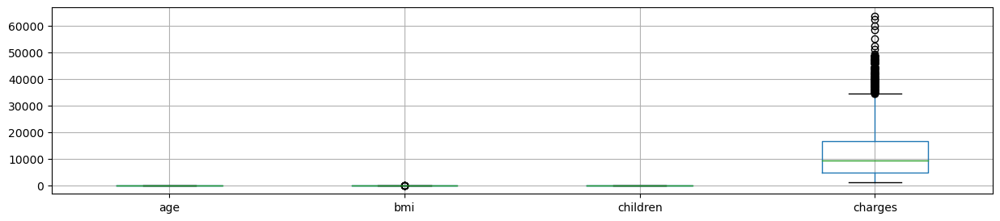

In [535]:
plt.figure(figsize = (15,3))
df.boxplot()

##### 7. Unique values and Value count

In [536]:
print(df['age'].unique())
df['age'].value_counts()

[19 18 28 33 32 31 46 37 60 25 62 23 56 27 52 30 34 59 63 55 22 26 35 24
 41 38 36 21 48 40 58 53 43 64 20 61 44 57 29 45 54 49 47 51 42 50 39]


18    69
19    68
50    29
51    29
47    29
46    29
45    29
20    29
48    29
52    29
22    28
49    28
54    28
53    28
21    28
26    28
24    28
25    28
28    28
27    28
23    28
43    27
29    27
30    27
41    27
42    27
44    27
31    27
40    27
32    26
33    26
56    26
34    26
55    26
57    26
37    25
59    25
58    25
36    25
38    25
35    25
39    25
61    23
60    23
63    23
62    23
64    22
Name: age, dtype: int64

In [537]:
print(df['sex'].unique())
df['sex'].value_counts()

['female' 'male']


male      676
female    662
Name: sex, dtype: int64

In [538]:
print(df['bmi'].unique())
df['bmi'].value_counts()

[27.9   33.77  33.    22.705 28.88  25.74  33.44  27.74  29.83  25.84
 26.22  26.29  34.4   39.82  42.13  24.6   30.78  23.845 40.3   35.3
 36.005 32.4   34.1   31.92  28.025 27.72  23.085 32.775 17.385 36.3
 35.6   26.315 28.6   28.31  36.4   20.425 32.965 20.8   36.67  39.9
 26.6   36.63  21.78  30.8   37.05  37.3   38.665 34.77  24.53  35.2
 35.625 33.63  28.    34.43  28.69  36.955 31.825 31.68  22.88  37.335
 27.36  33.66  24.7   25.935 22.42  28.9   39.1   36.19  23.98  24.75
 28.5   28.1   32.01  27.4   34.01  29.59  35.53  39.805 26.885 38.285
 37.62  41.23  34.8   22.895 31.16  27.2   26.98  39.49  24.795 31.3
 38.28  19.95  19.3   31.6   25.46  30.115 29.92  27.5   28.4   30.875
 27.94  35.09  29.7   35.72  32.205 28.595 49.06  27.17  23.37  37.1
 23.75  28.975 31.35  33.915 28.785 28.3   37.4   17.765 34.7   26.505
 22.04  35.9   25.555 28.05  25.175 31.9   36.    32.49  25.3   29.735
 38.83  30.495 37.73  37.43  24.13  37.145 39.52  24.42  27.83  36.85
 39.6   29.8   29.64 

32.300    13
28.310     9
30.495     8
30.875     8
31.350     8
          ..
46.200     1
23.800     1
44.770     1
32.120     1
30.970     1
Name: bmi, Length: 548, dtype: int64

In [539]:
print(df['children'].unique())
df['children'].value_counts()

[0 1 3 2 5 4]


0    574
1    324
2    240
3    157
4     25
5     18
Name: children, dtype: int64

In [540]:
print(df['smoker'].unique())
df['smoker'].value_counts()

['yes' 'no']


no     1064
yes     274
Name: smoker, dtype: int64

In [541]:
print(df['region'].unique())
df['region'].value_counts()

['southwest' 'southeast' 'northwest' 'northeast']


southeast    364
southwest    325
northwest    325
northeast    324
Name: region, dtype: int64

In [542]:
from pandas_profiling import ProfileReport

#The pandas profiling library can create, in a few lines of code, a rich and interactive suite of exploratory data analysis 
#(EDA) tables and visualizations.
prof = ProfileReport(df)
prof.to_file(output_file = '/Machine Learning/Decision Tree CR/36_Neelam Thakur_Medical insurance Decision Tree_e2e Model/templates/output.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# 4. Feature Engineering

In [543]:
df1 = pd.DataFrame(df.drop('charges', axis = 1))
df1.sample(10)

,age,sex,bmi,children,smoker,region
420,64,male,33.880,0,yes,southeast
1093,22,female,30.400,0,yes,northwest
1145,52,male,32.775,3,no,northwest
631,24,male,29.300,0,no,southwest
300,36,male,27.550,3,no,northeast
713,20,male,40.470,0,no,northeast
802,21,male,22.300,1,no,southwest
907,44,female,32.340,1,no,southeast
179,41,female,33.155,3,no,northeast
817,23,male,37.100,3,no,southwest


##### 1. Encoding (Converting Categorical data into Numerical form)

In [544]:
df1 = pd.get_dummies(df1)
df1['charges'] = df['charges']
df1.sample(10)

,age,bmi,children,sex_female,sex_male,smoker_no,smoker_yes,region_northeast,region_northwest,region_southeast,region_southwest,charges
1127,35,35.860,2,1,0,1,0,0,0,1,0,5836.52040
276,19,20.615,2,0,1,1,0,0,1,0,0,2803.69785
934,32,37.180,2,0,1,1,0,0,0,1,0,4673.39220
676,55,40.810,3,1,0,1,0,0,0,1,0,12485.80090
509,57,28.700,0,1,0,1,0,0,0,0,1,11455.28000
963,46,24.795,3,0,1,1,0,1,0,0,0,9500.57305
925,50,32.110,2,0,1,1,0,1,0,0,0,25333.33284
953,44,30.200,2,0,1,0,1,0,0,0,1,38998.54600
1181,24,29.925,0,1,0,1,0,0,1,0,0,2850.68375
1217,29,37.290,2,0,1,1,0,0,0,1,0,4058.11610


#### 2. Outliers Imputation

###### 1.

<AxesSubplot:xlabel='age'>

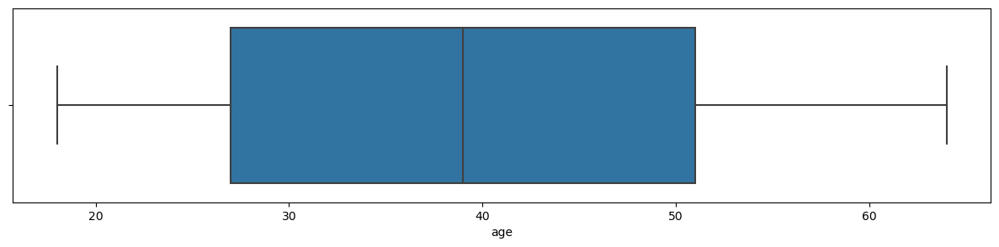

In [545]:
plt.figure(figsize = (15,3))
sns.boxplot(df1['age'])              # No outliers

###### 2.

<AxesSubplot:xlabel='bmi'>

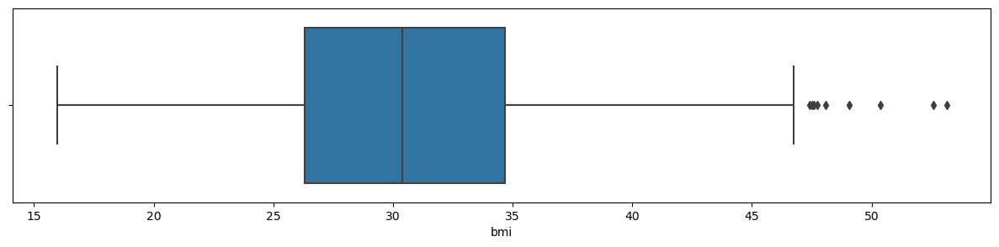

In [546]:
plt.figure(figsize = (15,3))
sns.boxplot(df1['bmi'])              # Their are outliers

In [547]:
# Outlier Imputation using IQR method

q1 = df1['bmi'].quantile(0.25)
q2 = df1['bmi'].quantile(0.50)
q3 = df1['bmi'].quantile(0.75)
median = df['bmi'].median()

IQR = q3 - q1

upper_tail = q3 + (1.5 * IQR)
lower_tail = q1 - (1.5 * IQR)

print("Q1 :", q1)
print("Q2 :", q2)
print("Q3 :", q3)
print("Median :",median)

print("upper_tail :", upper_tail)
print("lower_tail :", lower_tail)

Q1 : 26.29625
Q2 : 30.4
Q3 : 34.69375
Median : 30.4
upper_tail : 47.290000000000006
lower_tail : 13.7


In [548]:
df1[['bmi']].loc[df1['bmi'] > upper_tail] # uppertail outliers

,bmi
116,49.06
286,48.07
401,47.52
543,47.41
847,50.38
860,47.60
1047,52.58
1088,47.74
1317,53.13


In [549]:
df1[['bmi']].loc[df1['bmi'] < lower_tail] # lowertail outliers

,bmi


In [550]:
df1.loc[df1['bmi'] > upper_tail, 'bmi'] = upper_tail # Outlier imputation using uppertail value

<AxesSubplot:xlabel='bmi'>

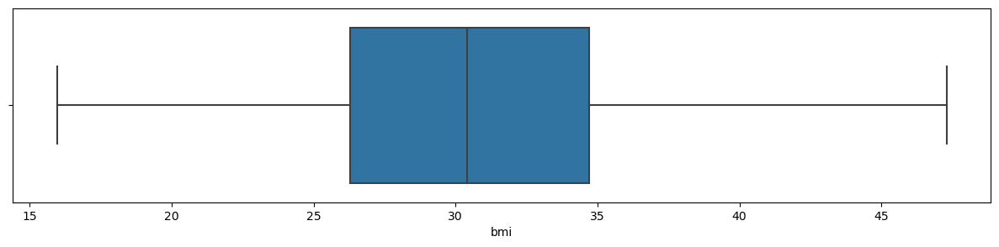

In [551]:
plt.figure(figsize = (15,3))
sns.boxplot(df1['bmi'])

###### 3.

<AxesSubplot:xlabel='children'>

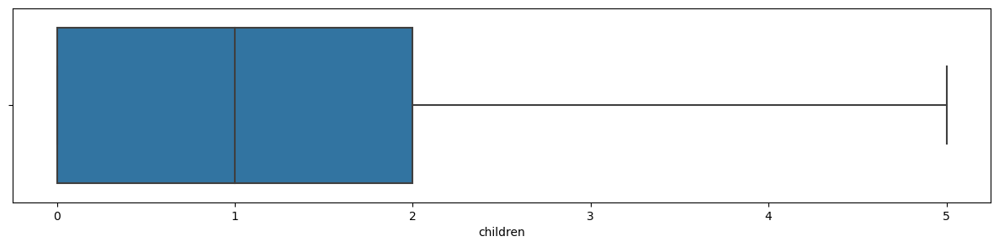

In [552]:
plt.figure(figsize = (15,3))
sns.boxplot(df1['children'])              # No outliers

<AxesSubplot:>

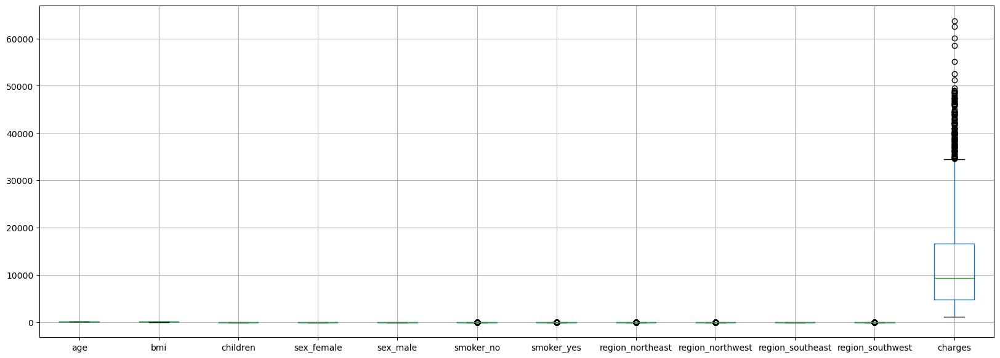

In [553]:
plt.figure(figsize = (20,7))
df1.boxplot()

# 5. Model Building

#### 1. Splitting the data into Traing data and Tesing data

In [554]:
x = df1.drop('charges', axis = 1)
y = df1['charges']

In [555]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state = 10)

In [556]:
x_train.shape

(1070, 11)

In [557]:
x_test.shape

(268, 11)

In [558]:
y_train.shape

(1070,)

In [559]:
y_test.shape

(268,)

#### 2. Model Instance Creation

In [560]:
dec_tree_reg = DecisionTreeRegressor()
model_details.append("Basic Model")

#### 3. Model fitting on training data

In [561]:
print(dec_tree_reg.fit(x_train,y_train))
model_instance.append("dec_tree_reg")

DecisionTreeRegressor()


# 6. Model Evaluation

#### 1. Evaluation on Traing Data

In [562]:
y_pred_train = dec_tree_reg.predict(x_train)
y_pred_train[:10]

array([ 1646.4297 ,  9617.66245,  2203.47185,  1137.011  ,  9487.6442 ,
        7731.85785,  7443.64305,  2523.1695 , 34472.841  ,  1969.614  ])

In [563]:
mse = mean_squared_error(y_train, y_pred_train)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_train, y_pred_train)
print("R Squared Value :",r_squared_value)

training_accuracy.append(r_squared_value)

Mean Sqaured Error : 0.0
Root Mean Sqaured Error : 0.0
Mean Absolute Error : 0.0
R Squared Value : 1.0


#### 2. Evaluation on Testing Data

In [564]:
y_pred_test = dec_tree_reg.predict(x_test)
y_pred_test[:10]

array([ 6198.7518 ,  5272.1758 , 27941.28758, 12142.5786 ,  3556.9223 ,
        7639.41745, 14478.33015, 26125.67477,  9193.8385 , 18767.7377 ])

In [565]:
mse = mean_squared_error(y_test, y_pred_test)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_test, y_pred_test)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_test, y_pred_test)
print("R Squared Value :",r_squared_value)

testing_accuracy.append(r_squared_value)

Mean Sqaured Error : 46682639.824935
Root Mean Sqaured Error : 6832.469526089011
Mean Absolute Error : 3319.394485858209
R Squared Value : 0.6671486091239558


In [598]:
plt.figure(figsize=(250,250))
plot_tree(dec_tree_reg, feature_names=x.columns,  filled=True, rounded=True, precision=2)
print()
plt.savefig("/Machine Learning/Decision Tree CR/36_Neelam Thakur_Medical insurance Decision Tree_e2e Model/templates/Simple Decision Tree.png")

###  Techniques to avoid Overfitting

#### 1. Feature Selection

In [566]:
array = dec_tree_reg.feature_importances_
array

array([0.13400354, 0.20364573, 0.01680973, 0.00370698, 0.00330842,
       0.62282096, 0.        , 0.00349671, 0.00366893, 0.00466114,
       0.00387785])

<AxesSubplot:>

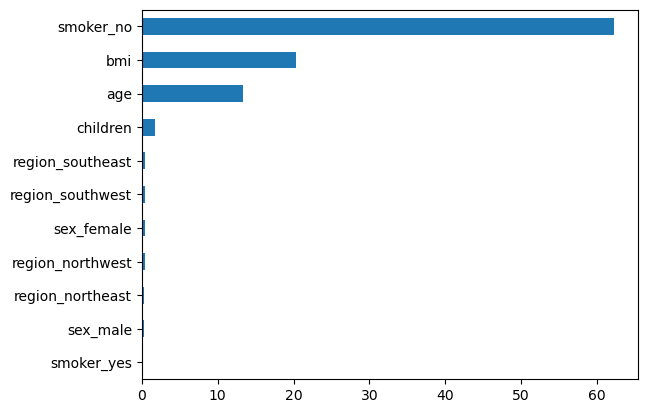

In [567]:
s1 = pd.Series(array * 100, index=x.columns)
s1.sort_values().plot(kind = "barh")

In [568]:
# Instance Creation
dec_tree_reg_feature_sel = DecisionTreeRegressor(random_state = 10)
model_details.append("Feature Selection")
model_instance.append("dec_tree_reg_feature_sel")

##### 1. Evaluation on Training Data

In [569]:
# Model fitting only on important features

In [570]:
dec_tree_reg_feature_sel.fit(x_train[['smoker_no','bmi', 'age', 'children', 'region_southwest', 'region_southeast', 'region_northwest', 'region_northeast']], y_train)

DecisionTreeRegressor(random_state=10)

In [571]:
y_pred_train = dec_tree_reg_feature_sel.predict(x_train[['smoker_no','bmi', 'age', 'children', 'region_southwest', 'region_southeast', 'region_northwest', 'region_northeast']])
y_pred_train[:10]

array([ 1646.4297 ,  9617.66245,  2203.47185,  1137.011  ,  9487.6442 ,
        7731.85785,  7443.64305,  2523.1695 , 34472.841  ,  1969.614  ])

In [572]:
mse = mean_squared_error(y_train, y_pred_train)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_train, y_pred_train)
print("R Squared Value :",r_squared_value)

training_accuracy.append(r_squared_value)

Mean Sqaured Error : 223.47757009345784
Root Mean Sqaured Error : 14.949166200609914
Mean Absolute Error : 0.9140186915887848
R Squared Value : 0.9999984909733388


##### 2. Evaluation on Testing Data

In [573]:
y_pred_test = dec_tree_reg_feature_sel.predict(x_test[['smoker_no','bmi', 'age', 'children', 'region_southwest', 'region_southeast', 'region_northwest', 'region_northeast']])
y_pred_test[:10]

array([ 6455.86265,  5272.1758 , 31620.00106, 12142.5786 ,  3062.50825,
        7639.41745, 14478.33015, 26125.67477,  8891.1395 , 18767.7377 ])

In [574]:
mse = mean_squared_error(y_test, y_pred_test)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_test, y_pred_test)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_test, y_pred_test)
print("R Squared Value :",r_squared_value)

testing_accuracy.append(r_squared_value)

Mean Sqaured Error : 44750430.897521324
Root Mean Sqaured Error : 6689.576286845178
Mean Absolute Error : 3271.049288432836
R Squared Value : 0.6809254313294821


#### 2. HyperParameter Tunning

###### 1. Pre Pruning

In [575]:
dt_reg = DecisionTreeRegressor(random_state = 10)

hyperparameter = {"criterion":['squared_error', 'absolute_error'], 
                  "max_depth": np.arange(2,10),
                 "min_samples_split": np.arange(2,20),
                 "min_samples_leaf": np.arange(2,15)}  

gscv_dt_reg = GridSearchCV(dt_reg, hyperparameter, cv=5)
gscv_dt_reg.fit(x_train, y_train)

model_details.append("HyperParameter Pre Pruning")

In [576]:
gscv_dt_reg.best_estimator_

DecisionTreeRegressor(criterion='absolute_error', max_depth=8,
                      min_samples_leaf=9, random_state=10)

In [577]:
dt_reg_HPT_PP_model = gscv_dt_reg.best_estimator_
model_instance.append("dt_reg_HPT_PP_model")
dt_reg_HPT_PP_model.fit(x_train, y_train)

DecisionTreeRegressor(criterion='absolute_error', max_depth=8,
                      min_samples_leaf=9, random_state=10)

In [578]:
# Evaluation on Training Data
y_pred_train = dt_reg_HPT_PP_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_train)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_train, y_pred_train)
print("R Squared Value :",r_squared_value)

training_accuracy.append(r_squared_value)

Mean Sqaured Error : 19332025.824149843
Root Mean Sqaured Error : 4396.81996722061
Mean Absolute Error : 1589.3561317467288
R Squared Value : 0.8694609827241333


In [579]:
# Evaluation on Testing Data
y_pred_test = dt_reg_HPT_PP_model.predict(x_test)

mse = mean_squared_error(y_test, y_pred_test)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_test, y_pred_test)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_test, y_pred_test)
print("R Squared Value :",r_squared_value)

testing_accuracy.append(r_squared_value)

Mean Sqaured Error : 26507134.080949083
Root Mean Sqaured Error : 5148.507947060884
Mean Absolute Error : 2133.8253495895524
R Squared Value : 0.8110017668223419


###### 2. Post Pruning / Cost Complexity Pruning

In [580]:
# Finding the ccp_alpha value
dt_reg = DecisionTreeRegressor(random_state = 10)

result = dt_reg.cost_complexity_pruning_path(x_train, y_train)
ccp_alpha_list = result['ccp_alphas']
ccp_alpha_list

array([0.00000000e+00, 1.44463276e-06, 8.14822476e-06, 8.14822694e-06,
       8.14822824e-06, 8.14823347e-06, 8.14823347e-06, 1.09244730e-05,
       1.09244882e-05, 1.12338810e-05, 3.25928782e-05, 3.25929025e-05,
       6.58178010e-05, 8.12565431e-05, 9.83204159e-05, 1.30371596e-04,
       1.30371607e-04, 1.30371608e-04, 1.30371610e-04, 1.44456075e-04,
       1.73828841e-04, 2.03705572e-04, 2.03705642e-04, 3.99263048e-04,
       4.40621122e-04, 4.42396745e-04, 4.94400916e-04, 5.35300026e-04,
       5.35300042e-04, 5.77824299e-04, 5.77824305e-04, 6.60006261e-04,
       6.60006262e-04, 6.99167401e-04, 8.14822529e-04, 8.84883705e-04,
       8.84883738e-04, 9.09161136e-04, 9.85935247e-04, 1.09244897e-03,
       1.09244906e-03, 1.09244907e-03, 1.44829917e-03, 1.52581727e-03,
       1.52581730e-03, 1.57312665e-03, 1.59202632e-03, 1.59705214e-03,
       1.59705217e-03, 1.59705218e-03, 1.59705219e-03, 1.69754697e-03,
       1.83335080e-03, 1.84623892e-03, 2.05280669e-03, 2.08594571e-03,
      

In [581]:
# using HyperParameter Tuning finding the best value of ccp_alpha

hyperparameter = {"ccp_alpha": ccp_alpha_list}  

gscv_dt_reg = GridSearchCV(dt_reg, hyperparameter, cv=5)
gscv_dt_reg.fit(x_train, y_train)
model_details.append("HyperParameter Post Pruning")

In [596]:
gscv_dt_reg.best_estimator_

DecisionTreeRegressor(ccp_alpha=314983.51376405486, random_state=10)

In [583]:
dt_reg_HPT_CCP_model = gscv_dt_reg.best_estimator_
model_instance.append("dt_reg_HPT_CCP_model")
dt_reg_HPT_CCP_model.fit(x_train, y_train)

DecisionTreeRegressor(ccp_alpha=314983.51376405486, random_state=10)

In [584]:
# Evaluation on Training Data
y_pred_train = dt_reg_HPT_CCP_model.predict(x_train)

mse = mean_squared_error(y_train, y_pred_train)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_train, y_pred_train)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_train, y_pred_train)
print("R Squared Value :",r_squared_value)

training_accuracy.append(r_squared_value)

Mean Sqaured Error : 19290148.725632466
Root Mean Sqaured Error : 4392.055182443917
Mean Absolute Error : 2514.5641407336134
R Squared Value : 0.8697437567767106


In [585]:
# Evaluation on Testing Data
y_pred_test = dt_reg_HPT_CCP_model.predict(x_test)

mse = mean_squared_error(y_test, y_pred_test)
print("Mean Sqaured Error :",mse)

rmse = np.sqrt(mse)
print("Root Mean Sqaured Error :",rmse)

mae = mean_absolute_error(y_test, y_pred_test)
print("Mean Absolute Error :",mae)

r_squared_value = r2_score(y_test, y_pred_test)
print("R Squared Value :",r_squared_value)

testing_accuracy.append(r_squared_value)

Mean Sqaured Error : 24752384.839195866
Root Mean Sqaured Error : 4975.176865117045
Mean Absolute Error : 2831.1429428390747
R Squared Value : 0.8235132856213337


In [586]:
# Finding the ccp_alpha value
dt_reg = DecisionTreeRegressor(random_state = 10)

result = dt_reg.cost_complexity_pruning_path(x_train, y_train)
ccp_alpha_list = result['ccp_alphas']
ccp_alpha_list

array([0.00000000e+00, 1.44463276e-06, 8.14822476e-06, 8.14822694e-06,
       8.14822824e-06, 8.14823347e-06, 8.14823347e-06, 1.09244730e-05,
       1.09244882e-05, 1.12338810e-05, 3.25928782e-05, 3.25929025e-05,
       6.58178010e-05, 8.12565431e-05, 9.83204159e-05, 1.30371596e-04,
       1.30371607e-04, 1.30371608e-04, 1.30371610e-04, 1.44456075e-04,
       1.73828841e-04, 2.03705572e-04, 2.03705642e-04, 3.99263048e-04,
       4.40621122e-04, 4.42396745e-04, 4.94400916e-04, 5.35300026e-04,
       5.35300042e-04, 5.77824299e-04, 5.77824305e-04, 6.60006261e-04,
       6.60006262e-04, 6.99167401e-04, 8.14822529e-04, 8.84883705e-04,
       8.84883738e-04, 9.09161136e-04, 9.85935247e-04, 1.09244897e-03,
       1.09244906e-03, 1.09244907e-03, 1.44829917e-03, 1.52581727e-03,
       1.52581730e-03, 1.57312665e-03, 1.59202632e-03, 1.59705214e-03,
       1.59705217e-03, 1.59705218e-03, 1.59705219e-03, 1.69754697e-03,
       1.83335080e-03, 1.84623892e-03, 2.05280669e-03, 2.08594571e-03,
      

In [587]:
subtracted = []
for i in range(len(training_accuracy)):
    item = training_accuracy[i] - testing_accuracy[i]
    subtracted.append(item)

comparison_df = pd.DataFrame({"Models": model_details, "Model Instance": model_instance, 
                              "Training Accuracy": training_accuracy, "Testing Accuracy": testing_accuracy,
                              "Train - Test": subtracted})
comparison_df

,Models,Model Instance,Training Accuracy,Testing Accuracy,Train - Test
0,Basic Model,dec_tree_reg,1.000000,0.667149,0.332851
1,Feature Selection,dec_tree_reg_feature_sel,0.999998,0.680925,0.319073
2,HyperParameter Pre Pruning,dt_reg_HPT_PP_model,0.869461,0.811002,0.058459
3,HyperParameter Post Pruning,dt_reg_HPT_CCP_model,0.869744,0.823513,0.046230


In [588]:
import pickle 
with open("/Machine Learning/Decision Tree CR/36_Neelam Thakur_Medical insurance Decision Tree_e2e Model/project_app/Linear_Model.pkl","wb") as f:
    pickle.dump(dt_reg_HPT_CCP_model,f)

In [589]:
column_names = x.columns
len(column_names)
json_data = {"columns":list(column_names), "Training Accuracy": training_accuracy[3], "Testing Accuracy": testing_accuracy[3]}
json_data

{'columns': ['age',
  'bmi',
  'children',
  'sex_female',
  'sex_male',
  'smoker_no',
  'smoker_yes',
  'region_northeast',
  'region_northwest',
  'region_southeast',
  'region_southwest'],
 'Training Accuracy': 0.8697437567767106,
 'Testing Accuracy': 0.8235132856213337}

In [590]:
import json
with open("/Machine Learning/Decision Tree CR/36_Neelam Thakur_Medical insurance Decision Tree_e2e Model/project_app/Medical_Insurance_data.json", "w") as f:
    json.dump(json_data, f)

In [591]:
age = 19.0
sex = "female"
bmi = 27.9
children = 2
smoker = "no"
region = "northwest"

sex = "sex_" + sex
sex_index = np.where(column_names == sex)[0]

smoker = "smoker_" + smoker
smoker_index = np.where(column_names == smoker)[0]

region = "region_" + region
region_index = np.where(column_names == region)[0][0]

In [592]:
sex_index = sex_index = list(column_names).index(sex)
smoker_index = smoker_index = list(column_names).index(smoker)
region_index = region_index = list(column_names).index(region)

In [593]:
test_array = np.zeros(len(column_names))

test_array[0] = age
test_array[1] = bmi
test_array[2] = children
test_array[sex_index] = 1
test_array[smoker_index] = 1
test_array[region_index] = 1

test_array

array([19. , 27.9,  2. ,  1. ,  0. ,  1. ,  0. ,  0. ,  1. ,  0. ,  0. ])

In [594]:
charges = round(dt_reg_HPT_CCP_model.predict([test_array])[0],2)
print("Predicted Medical Insurance Charges is :", charges, "/- Rs. Only")

Predicted Medical Insurance Charges is : 5454.62 /- Rs. Only
